# Demo Face Detection (MTCNN)
Chia ra 2 nhánh:

- **RAW**: ảnh gốc
- **PRE**: ảnh qua tiền xử lý theo slide (lọc nhiễu + tăng tương phản)

Sau đó hiển thị kết quả của cả hai và **tự chọn nhánh tốt hơn** theo tiêu chí:
1) phát hiện **nhiều khuôn mặt hơn** (sau khi lọc theo `min_confidence`);
2) nếu bằng nhau, chọn nhánh có **độ tin cậy trung bình (mean confidence) cao hơn**.


In [16]:
from pathlib import Path
import sys
import time
import numpy as np
import cv2
import matplotlib.pyplot as plt

PROJECT_ROOT = Path(r"C:\face_detection_mtcnn")
SRC_DIR = PROJECT_ROOT / "src"

DATA_DIR = Path(r"C:\face_detection_mtcnn\data")
INPUT_DIR = DATA_DIR / "input"
OUTPUT_DIR = DATA_DIR / "output"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Thêm src vào sys.path để import được các module của bạn
if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

print("PROJECT_ROOT:", PROJECT_ROOT)
print("INPUT_DIR:", INPUT_DIR)
print("OUTPUT_DIR:", OUTPUT_DIR)

PROJECT_ROOT: C:\face_detection_mtcnn
INPUT_DIR: C:\face_detection_mtcnn\data\input
OUTPUT_DIR: C:\face_detection_mtcnn\data\output


In [17]:
from detection_mtcnn_tf import FaceDetectorMTCNN
from preprocessing import read_image_rgb, preprocess_for_mtcnn
from visualization import draw_detections, save_rgb_image
from evaluation import boxes_to_centers, save_centers_txt

In [18]:
# Liệt kê ảnh trong input để chọn
image_paths = sorted(list(INPUT_DIR.glob("*.jpg")) + list(INPUT_DIR.glob("*.jpeg")) + list(INPUT_DIR.glob("*.png")))
if len(image_paths) == 0:
    raise RuntimeError(f"Không tìm thấy ảnh nào trong: {INPUT_DIR}")

image_paths[:10]  # hiển thị 10 ảnh đầu

[WindowsPath('C:/face_detection_mtcnn/data/input/test1.jpg'),
 WindowsPath('C:/face_detection_mtcnn/data/input/test10.jpg'),
 WindowsPath('C:/face_detection_mtcnn/data/input/test11.jpg'),
 WindowsPath('C:/face_detection_mtcnn/data/input/test12.jpg'),
 WindowsPath('C:/face_detection_mtcnn/data/input/test13.jpg'),
 WindowsPath('C:/face_detection_mtcnn/data/input/test14.jpg'),
 WindowsPath('C:/face_detection_mtcnn/data/input/test15.jpg'),
 WindowsPath('C:/face_detection_mtcnn/data/input/test2.jpg'),
 WindowsPath('C:/face_detection_mtcnn/data/input/test3.jpg'),
 WindowsPath('C:/face_detection_mtcnn/data/input/test4.jpg')]

Số lượng ảnh trong INPUT: 15
Ví dụ 3 ảnh đầu: ['test1.jpg', 'test10.jpg', 'test11.jpg']

[1/15] Processing: test1.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━

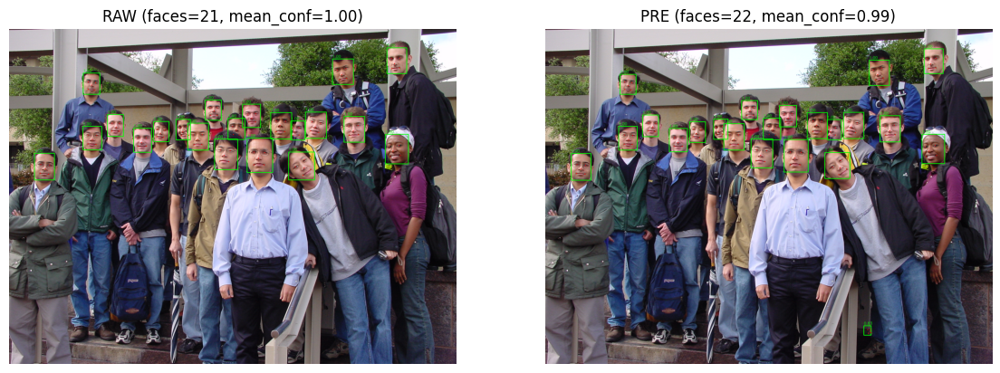


[2/15] Processing: test10.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━

,image,raw_n,raw_s,raw_t_ms,pre_n,pre_s,pre_t_ms
0,test1.jpg,21,0.999949,2206.5347,22,0.991939,1639.2321
1,test10.jpg,13,0.999631,1682.0649,13,0.999647,1581.6793
2,test11.jpg,14,0.997227,1579.7339,15,0.984660,1771.7840
3,test12.jpg,149,0.997850,5066.3822,42,0.944836,3450.6384
4,test13.jpg,84,0.947097,1407.1931,111,0.965131,1575.7427


In [19]:
print(f"Số lượng ảnh trong INPUT: {len(image_paths)}")
print("Ví dụ 3 ảnh đầu:", [p.name for p in image_paths[:3]])
# CẤU HÌNH DETECTOR + PREPROCESS
min_confidence = 0.8
detector = FaceDetectorMTCNN(min_confidence=min_confidence)
# Nếu muốn tăng tốc bằng resize, đặt target_size (width, height).
# Lưu ý: khi resize cần scale bbox/landmarks về ảnh gốc (đã xử lý trong code bên dưới).
target_size = None  # ví dụ: (640, 480)

pre_cfg = dict(
    target_size=target_size,
    denoise="gaussian",   # none/gaussian/median/bilateral
    contrast="eqhist",    # none/eqhist/clahe
    use_gamma=False,      # True nếu ảnh tối
    gamma=1.4,            # gamma > 1 để làm sáng (theo implement hiện tại)
)

import inspect

def preprocess_dispatch(img_rgb, cfg: dict):
    """
    Call preprocess_for_mtcnn(img_rgb, **kwargs) with:
    - Only supported kwargs (filtered by function signature)
    - A small alias-mapping for common parameter name differences
    """
    try:
        sig = inspect.signature(preprocess_for_mtcnn)
        params = list(sig.parameters.keys())
        allowed = set(params[1:]) 
    except Exception:
        allowed = set(cfg.keys())

    out_kwargs = {}

    def _set_first_match(value, candidates):
        for k in candidates:
            if k in allowed:
                out_kwargs[k] = value
                return True
        return False

    # target_size / resize
    if "target_size" in cfg and cfg["target_size"] is not None:
        _set_first_match(cfg["target_size"], ["target_size", "resize", "size", "new_size", "out_size", "img_size"])

    # denoise method / flags
    if "denoise" in cfg and cfg["denoise"] is not None:
        den = cfg["denoise"]
        _set_first_match(den, ["denoise", "denoise_method", "denoise_type", "filter", "filter_type", "blur_type", "method"])
        if den not in (False, "none", None):
            _set_first_match(True, ["use_denoise", "do_denoise", "apply_denoise", "use_blur", "do_blur", "apply_blur"])

    # contrast / equalize
    if "contrast" in cfg and cfg["contrast"] is not None:
        con = cfg["contrast"]
        _set_first_match(con, ["contrast", "contrast_method", "equalize", "equalize_method", "hist_eq", "eq_method"])
        if con not in (False, "none", None):
            _set_first_match(True, ["use_contrast", "do_contrast", "apply_contrast", "do_equalize", "apply_equalize", "do_hist_eq", "apply_hist_eq"])

    # gamma
    if "use_gamma" in cfg:
        _set_first_match(cfg["use_gamma"], ["use_gamma", "do_gamma", "apply_gamma"])
    if "gamma" in cfg:
        _set_first_match(cfg["gamma"], ["gamma", "gamma_value"])

    # pass-through any exact supported keys
    for k, v in cfg.items():
        if k in allowed and k not in out_kwargs:
            out_kwargs[k] = v

    # finally call
    try:
        return preprocess_for_mtcnn(img_rgb, **out_kwargs)
    except TypeError:
        # ultimate fallback: call without kwargs
        return preprocess_for_mtcnn(img_rgb)

def _rescale_boxes(boxes, sx, sy):
    if boxes is None or len(boxes) == 0:
        return np.zeros((0, 4), dtype=np.float32)
    b = np.asarray(boxes, dtype=np.float32).copy()
    b[:, [0, 2]] *= sx
    b[:, [1, 3]] *= sy
    return b

def _rescale_landmarks(landmarks, sx, sy):
    out = []
    for lm in (landmarks or []):
        lm2 = {}
        for k, (x, y) in lm.items():
            lm2[k] = (float(x) * sx, float(y) * sy)
        out.append(lm2)
    return out

def run_detect(img_rgb, do_preprocess: bool):
    # preprocess
    if do_preprocess:
        img_in = preprocess_dispatch(img_rgb, pre_cfg)
    else:
        img_in = img_rgb.copy()

    # detect
    t0 = time.perf_counter()
    boxes, scores, landmarks = detector.detect(img_in)
    t1 = time.perf_counter()

    # scale về ảnh gốc nếu có resize
    H0, W0 = img_rgb.shape[:2]
    H1, W1 = img_in.shape[:2]
    if (H1, W1) != (H0, W0):
        sx, sy = (W0 / W1), (H0 / H1)
        boxes = _rescale_boxes(boxes, sx, sy)
        landmarks = _rescale_landmarks(landmarks, sx, sy)

    # metrics
    n_faces = int(len(boxes)) if boxes is not None else 0
    mean_conf = float(np.mean(scores)) if scores is not None and len(scores) > 0 else 0.0
    time_ms = (t1 - t0) * 1000.0

    # visualization on original image (để thống nhất)
    img_vis = draw_detections(img_rgb, boxes, scores=scores, landmarks=landmarks)

    return {
        "img_in": img_in,
        "boxes": boxes,
        "scores": scores,
        "landmarks": landmarks,
        "n_faces": n_faces,
        "mean_conf": mean_conf,
        "time_ms": time_ms,
        "img_vis": img_vis,
    }

def choose_best(raw_res, pre_res):
    # Ưu tiên nhiều mặt hơn; nếu hoà thì ưu tiên mean_conf; nếu vẫn hoà thì ưu tiên nhanh hơn
    if pre_res["n_faces"] > raw_res["n_faces"]:
        return "pre"
    if pre_res["n_faces"] < raw_res["n_faces"]:
        return "raw"
    # tie-breaker 1
    if pre_res["mean_conf"] > raw_res["mean_conf"]:
        return "pre"
    if pre_res["mean_conf"] < raw_res["mean_conf"]:
        return "raw"
    # tie-breaker 2
    return "pre" if pre_res["time_ms"] <= raw_res["time_ms"] else "raw"


import pandas as pd

max_preview = 1  # số ảnh hiển thị trực tiếp (tránh spam output)
results = []

# thư mục con gọn gàng
cmp_dir = OUTPUT_DIR / "compare"
cmp_dir.mkdir(parents=True, exist_ok=True)

for i, img_path in enumerate(image_paths):
    print(f"\n[{i+1}/{len(image_paths)}] Processing: {img_path.name}")

    # đọc ảnh
    img_rgb = read_image_rgb(img_path)

    # chạy 2 nhánh
    raw_res = run_detect(img_rgb, do_preprocess=False)
    pre_res = run_detect(img_rgb, do_preprocess=True)

    # chọn nhánh tốt nhất
    best = choose_best(raw_res, pre_res)
    best_res = pre_res if best == "pre" else raw_res

    # log nhanh
    print("=== RAW ===")
    print(f"n_faces={raw_res['n_faces']}, mean_conf={raw_res['mean_conf']:.3f}, time_ms={raw_res['time_ms']:.1f}")
    print("=== PRE ===")
    print(f"n_faces={pre_res['n_faces']}, mean_conf={pre_res['mean_conf']:.3f}, time_ms={pre_res['time_ms']:.1f}")
    print(f"==> CHỌN: {best.upper()}")

    # (Tuỳ chọn) hiển thị vài ảnh đầu để kiểm tra trực quan
    if i < max_preview:
        plt.figure(figsize=(14, 6))
        plt.subplot(1, 2, 1)
        plt.title(f"RAW (faces={raw_res['n_faces']}, mean_conf={raw_res['mean_conf']:.2f})")
        plt.imshow(raw_res["img_vis"])
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.title(f"PRE (faces={pre_res['n_faces']}, mean_conf={pre_res['mean_conf']:.2f})")
        plt.imshow(pre_res["img_vis"])
        plt.axis("off")
        plt.show()
        
    # LƯU OUTPUT: lưu cả 2 nhánh + nhánh BEST
    stem = Path(img_path).stem

    # Lưu annotated
    save_rgb_image(cmp_dir / f"{stem}_raw_annotated.jpg", raw_res["img_vis"])
    save_rgb_image(cmp_dir / f"{stem}_pre_annotated.jpg", pre_res["img_vis"])
    save_rgb_image(cmp_dir / f"{stem}_best_{best}_annotated.jpg", best_res["img_vis"])

    # Lưu ảnh preprocess (để đối chiếu)
    save_rgb_image(cmp_dir / f"{stem}_pre_image.jpg", pre_res["img_in"])

    # Lưu centers của nhánh best
    centers = boxes_to_centers(best_res["boxes"])
    save_centers_txt(cmp_dir / f"{stem}_best_{best}_centers.txt", centers)

    # lưu metrics để tính trung bình
    results.append({
        "image": img_path.name,
        "raw_n": raw_res["n_faces"],
        "raw_s": raw_res["mean_conf"],
        "raw_t_ms": raw_res["time_ms"],
        "pre_n": pre_res["n_faces"],
        "pre_s": pre_res["mean_conf"],
        "pre_t_ms": pre_res["time_ms"],
    })

df_results = pd.DataFrame(results)

print("\nDone. Saved to:", cmp_dir)
df_results.head()


In [20]:
# BẢNG: Kết quả trung bình trên tập kiểm thử
import pandas as pd
import numpy as np

if "df_results" not in globals() or df_results is None or len(df_results) == 0:
    # Template (sẽ có số sau khi chạy cell xử lý ảnh)
    df_summary = pd.DataFrame({
        "Nhánh": ["RAW", "PRE"],
        "Avg(N)": [np.nan, np.nan],
        "Avg(s)": [np.nan, np.nan],
        "Avg(t) (ms)": [np.nan, np.nan],
    })
else:
    df_summary = pd.DataFrame({
        "Nhánh": ["RAW", "PRE"],
        "Avg(N)": [df_results["raw_n"].mean(), df_results["pre_n"].mean()],
        "Avg(s)": [df_results["raw_s"].mean(), df_results["pre_s"].mean()],
        "Avg(t) (ms)": [df_results["raw_t_ms"].mean(), df_results["pre_t_ms"].mean()],
    })
    # làm đẹp số liệu
    df_summary["Avg(N)"] = df_summary["Avg(N)"].round(2)
    df_summary["Avg(s)"] = df_summary["Avg(s)"].round(3)
    df_summary["Avg(t) (ms)"] = df_summary["Avg(t) (ms)"].round(1)

df_summary


,Nhánh,Avg(N),Avg(s),Avg(t) (ms)
0,RAW,32.80,0.995,3352.4
1,PRE,27.67,0.991,3462.2


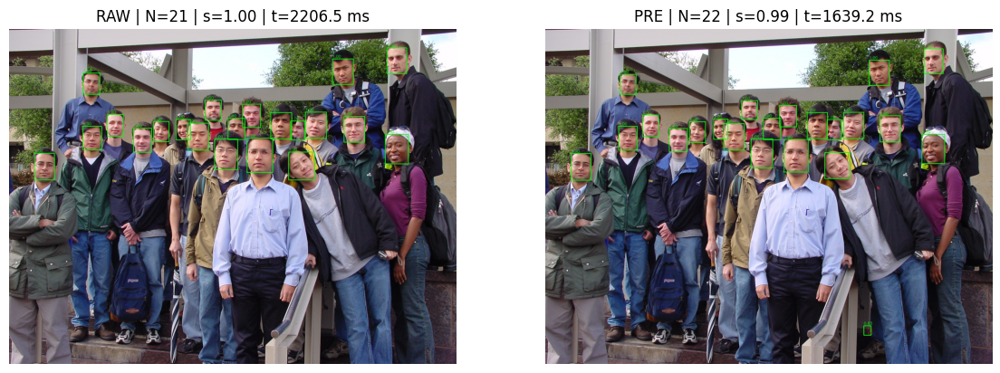

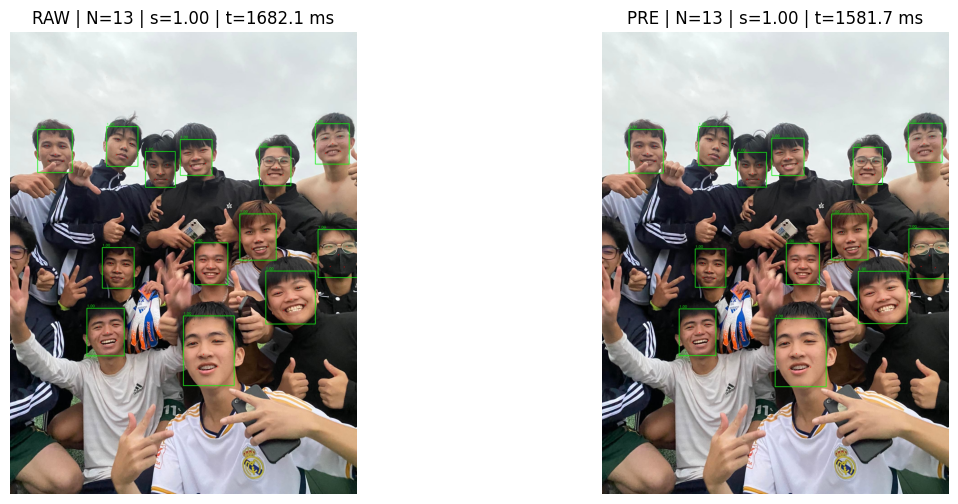

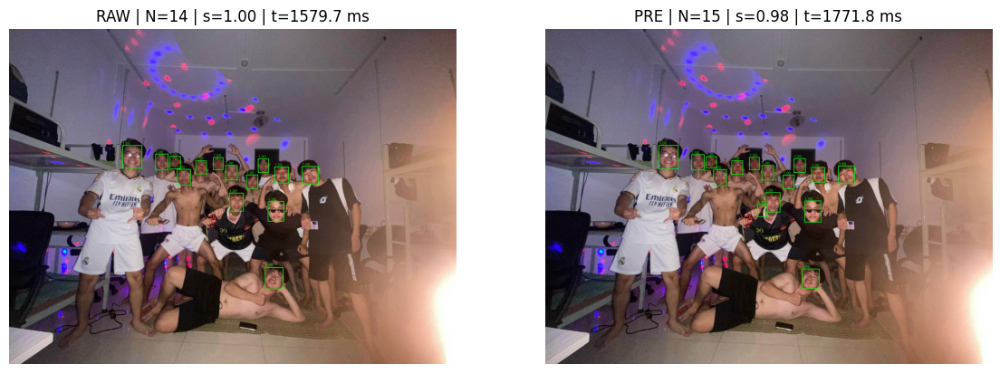

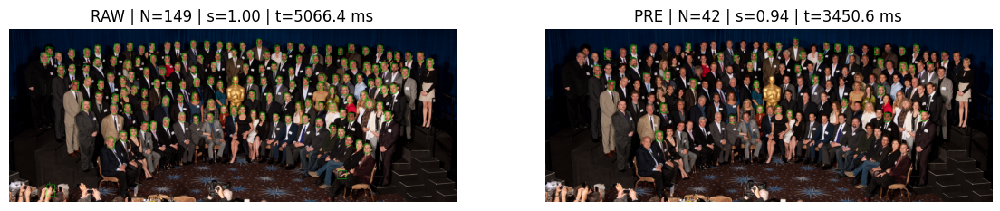

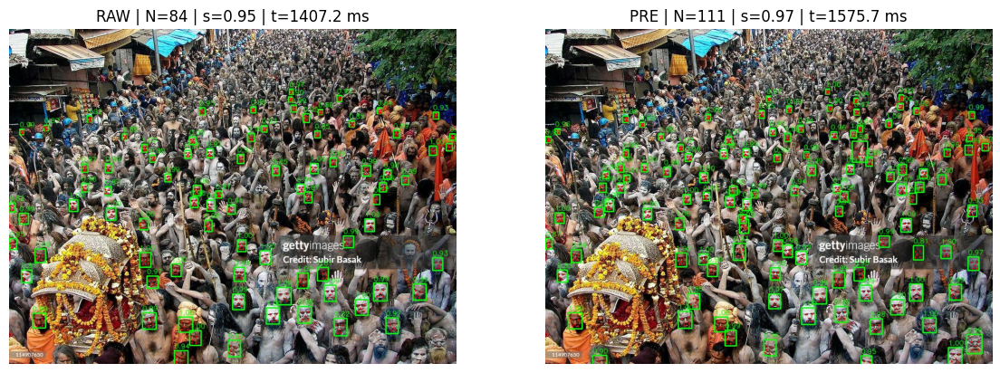

...

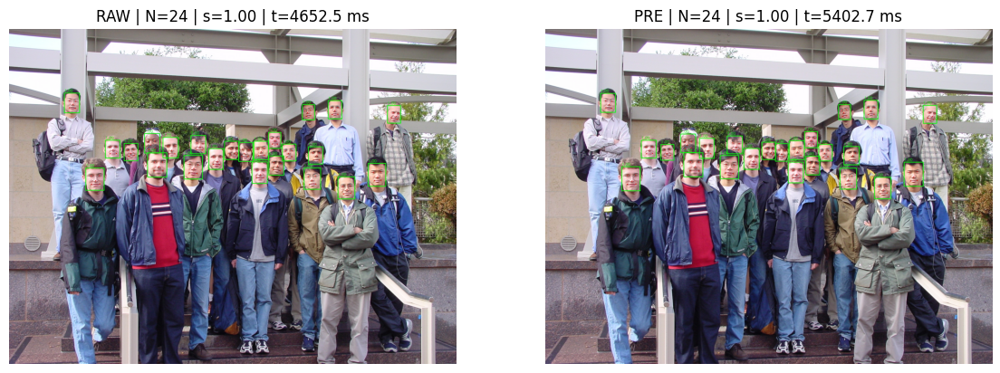

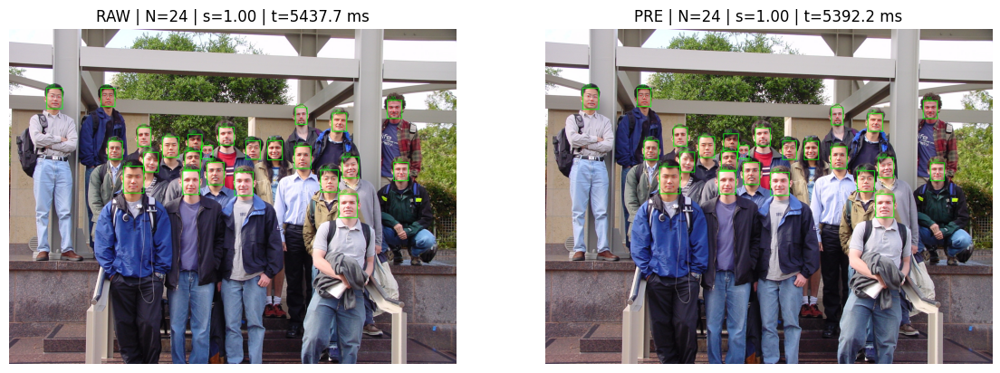

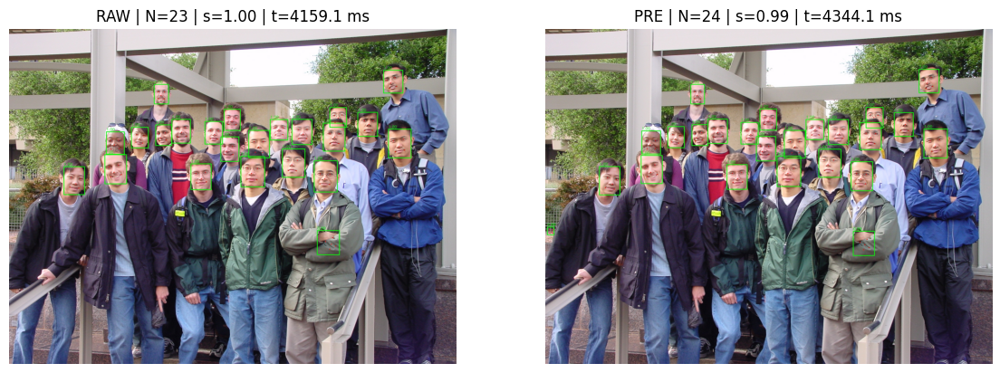

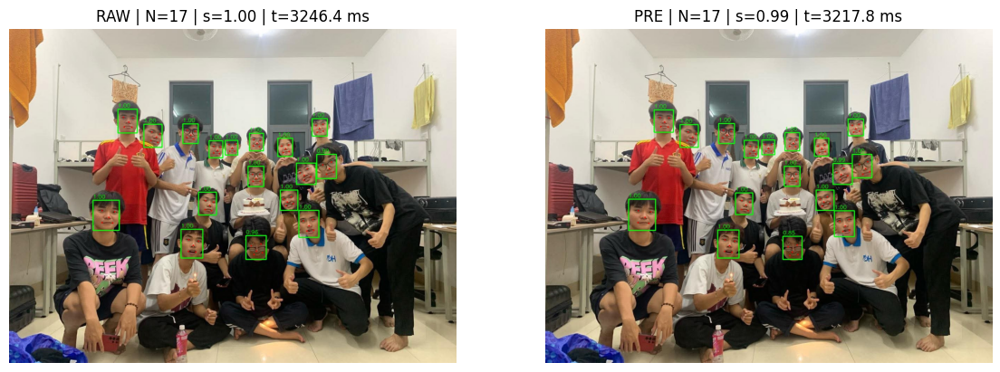

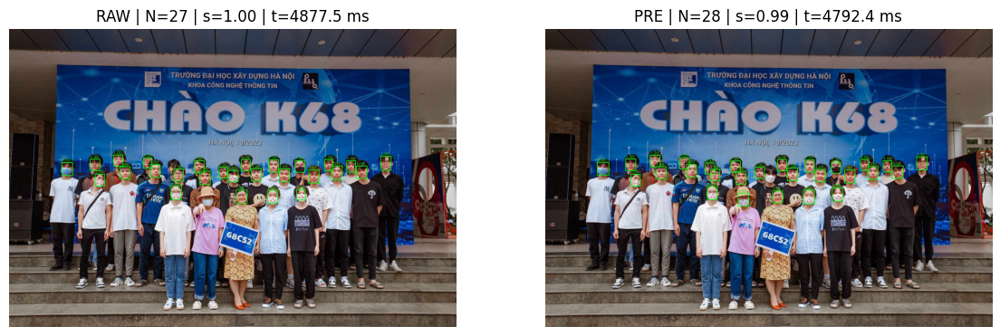

In [21]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path
for idx, row in df_results.iterrows():
    stem = Path(row["image"]).stem

    raw_path = cmp_dir / f"{stem}_raw_annotated.jpg"
    pre_path = cmp_dir / f"{stem}_pre_annotated.jpg"

    fig = plt.figure(figsize=(14, 6))

    ax1 = fig.add_subplot(1, 2, 1)
    ax1.imshow(mpimg.imread(raw_path))
    ax1.set_title(f"RAW | N={row['raw_n']} | s={row['raw_s']:.2f} | t={row['raw_t_ms']:.1f} ms")
    ax1.axis("off")

    ax2 = fig.add_subplot(1, 2, 2)
    ax2.imshow(mpimg.imread(pre_path))
    ax2.set_title(f"PRE | N={row['pre_n']} | s={row['pre_s']:.2f} | t={row['pre_t_ms']:.1f} ms")
    ax2.axis("off")

    plt.show()
    plt.close(fig)  # giải phóng bộ nhớ


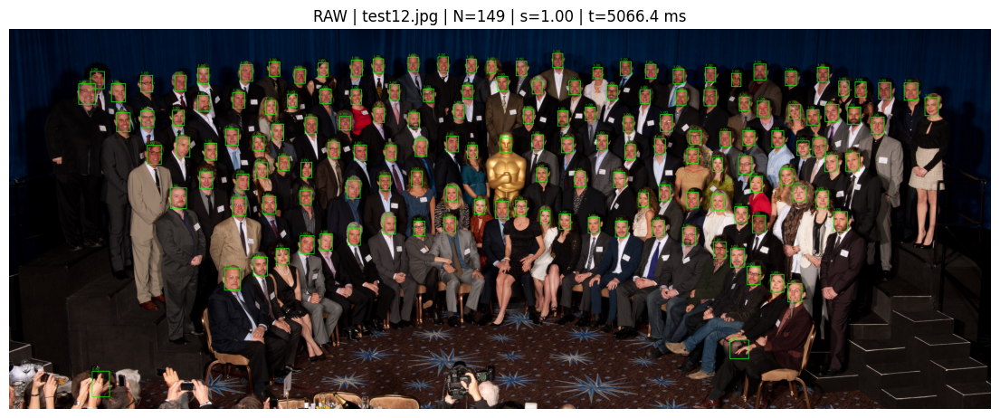

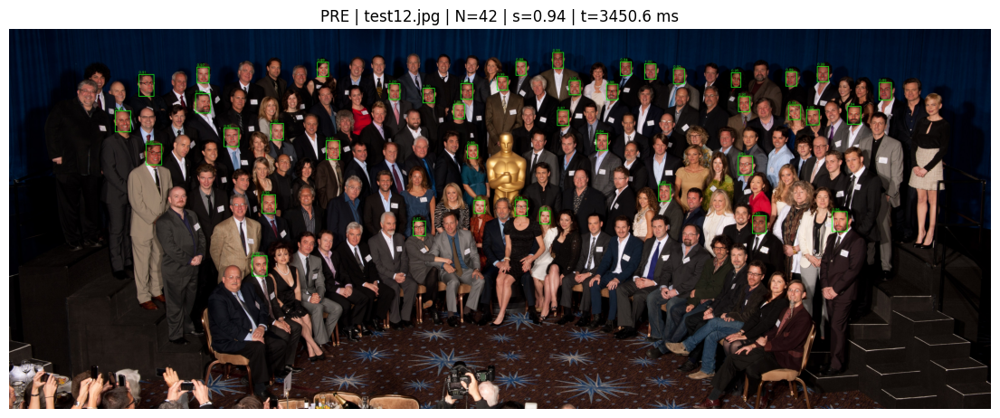

In [22]:
# ===== SHOW ẢNH THỨ K (RAW/PRE) THEO df_results =====
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path

def show_file(path, title, figsize=(14, 6)):
    plt.figure(figsize=figsize)
    plt.title(title)
    plt.imshow(mpimg.imread(path))
    plt.axis("off")
    plt.show()
    plt.close()

K =4  # <-- muốn xem ảnh thứ 12 (1-based). Nếu muốn index 0-based thì dùng iloc[K]
row = df_results.iloc[K - 1]  # 1-based -> 0-based
stem = Path(row["image"]).stem

raw_path = cmp_dir / f"{stem}_raw_annotated.jpg"
pre_path = cmp_dir / f"{stem}_pre_annotated.jpg"

show_file(raw_path, f"RAW | {row['image']} | N={row['raw_n']} | s={row['raw_s']:.2f} | t={row['raw_t_ms']:.1f} ms")
show_file(pre_path, f"PRE | {row['image']} | N={row['pre_n']} | s={row['pre_s']:.2f} | t={row['pre_t_ms']:.1f} ms")
